#Metadata:
----
*   @Autor:Julian Camilo Escobar Araque
*   @Date: 2022/02/19
*   @Description:Uso de HaarCascade para analisis de sonrisas , fullbody y video 


#1.Montar Google Drive en Google colaboratory 

In [ ]:
from google.colab import drive
drive.mount('/content/drive') 

Mounted at /content/drive


#2.Importando librerías necesarias.

In [ ]:
import cv2                                  #libreria de opencv
import numpy as np                          #libreria para manejo de arrays 
from matplotlib import pyplot as plt        #libreria para visualizar graficos y otros
from google.colab.patches import cv2_imshow #modulo para visualizar imagenes en google colaboratory

#3.Cargando y visualizando imagenes

Image Dimensiones  :  (800, 800, 3)
Alto:  800 ,Ancho:  800 Número de canales: 3


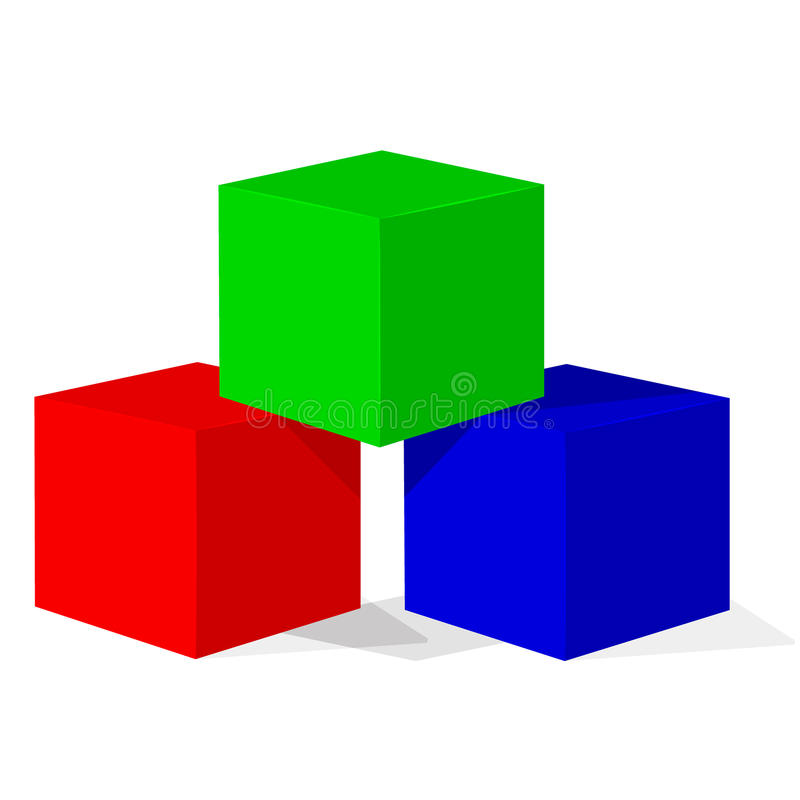

In [ ]:
img = cv2.imread("/content/drive/MyDrive/DeepLearning/Images/Img1.jpg")
if img.size == 0:
  print("Error: la imagen no fue cargada con exito.")
else:
  print('Image Dimensiones  : ',img.shape)
  print("Alto: ",str(img.shape[0]),",Ancho: ",img.shape[1],"Número de canales:",img.shape[2])
  cv2_imshow(img)

#4.Aplicando filtros

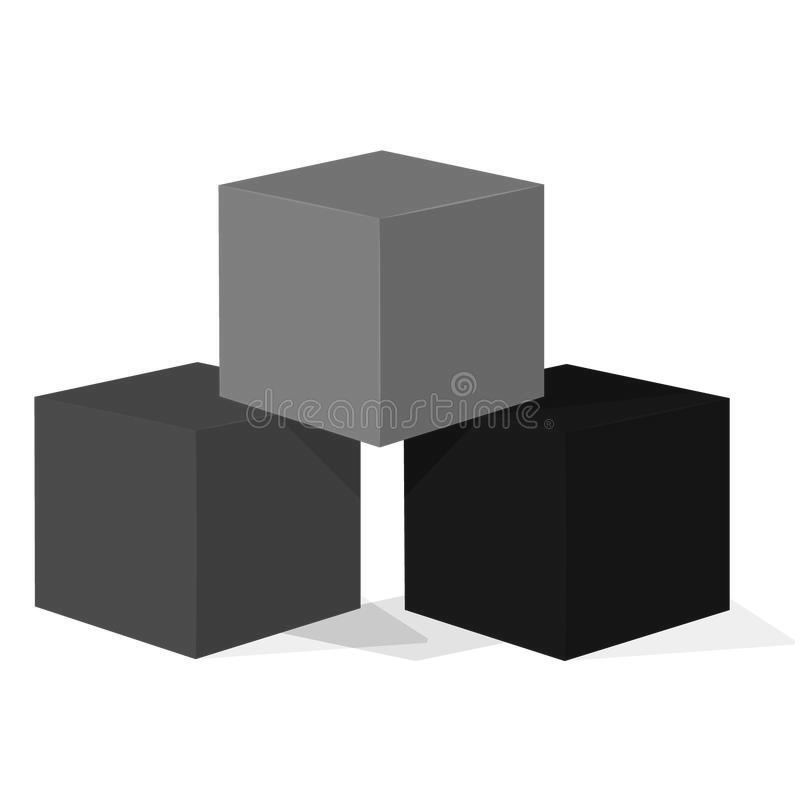

In [ ]:
#convirtiendo la imagen a escala de grises
processed_image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#guardando la imagen en drive
#cv2.imwrite('/content/drive/My Drive/IA/Computer_Vision/Images/image1_processed_gray.png', processed_image)
cv2_imshow(processed_image)

##channels colors

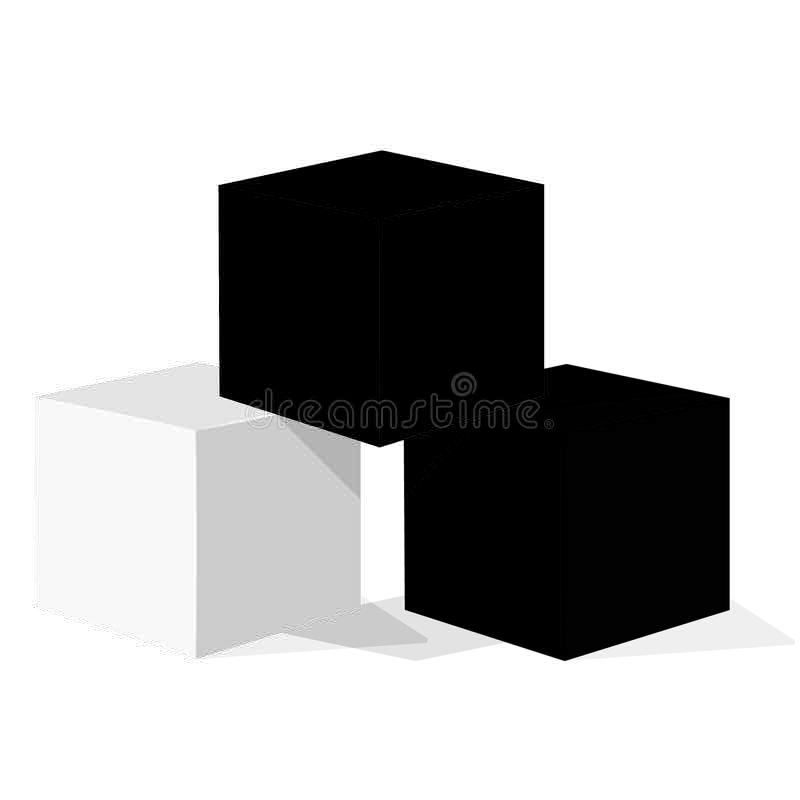

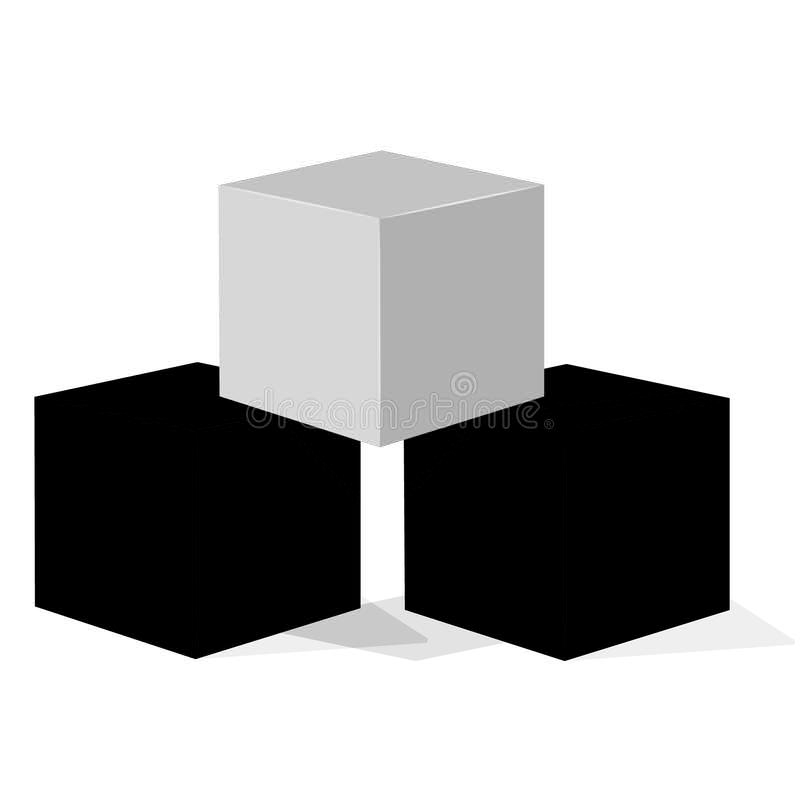

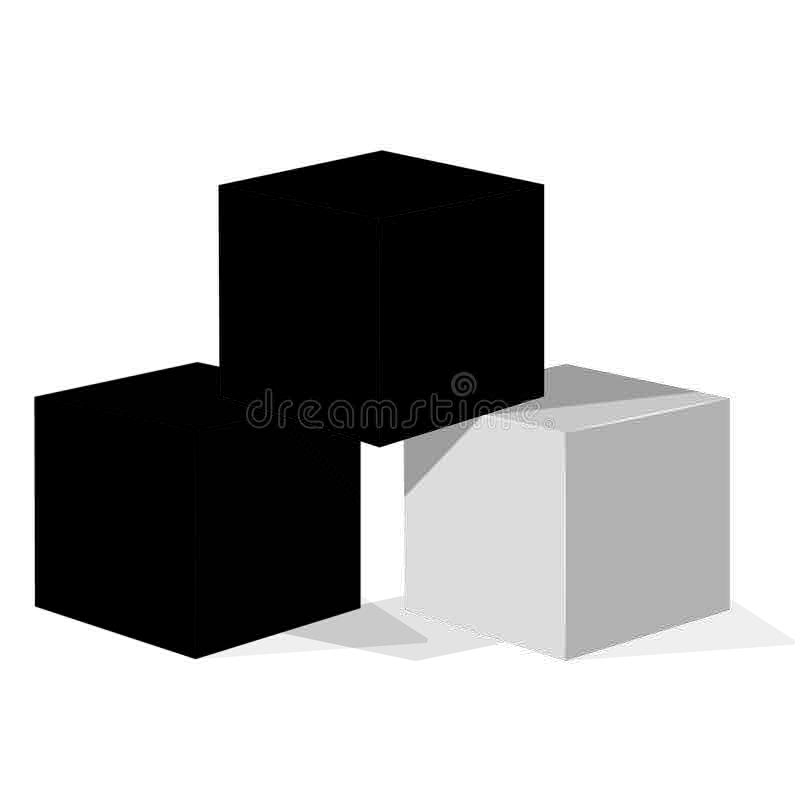

In [ ]:
#extrayendo el canal rojo (RED channel)
red_channel = img[:,:,2]
#extrayendo el canal verde (Green channel)
green_channel = img[:,:,1]
#extrayendo el canal azul (blue channel)
blue_channel = img[:,:,0]
#cv2.imwrite('/content/drive/My Drive/IA/Computer_Vision/Images/image1_processed_red.png', red_channel)
#cv2.imwrite('/content/drive/My Drive/IA/Computer_Vision/Images/image1_processed_green.png', green_channel)
#cv2.imwrite('/content/drive/My Drive/IA/Computer_Vision/Images/image1_processed_blue.png', blue_channel)
cv2_imshow(red_channel)
cv2_imshow(green_channel)
cv2_imshow(blue_channel)


##Resaltado de un color (ejemplo el verde)

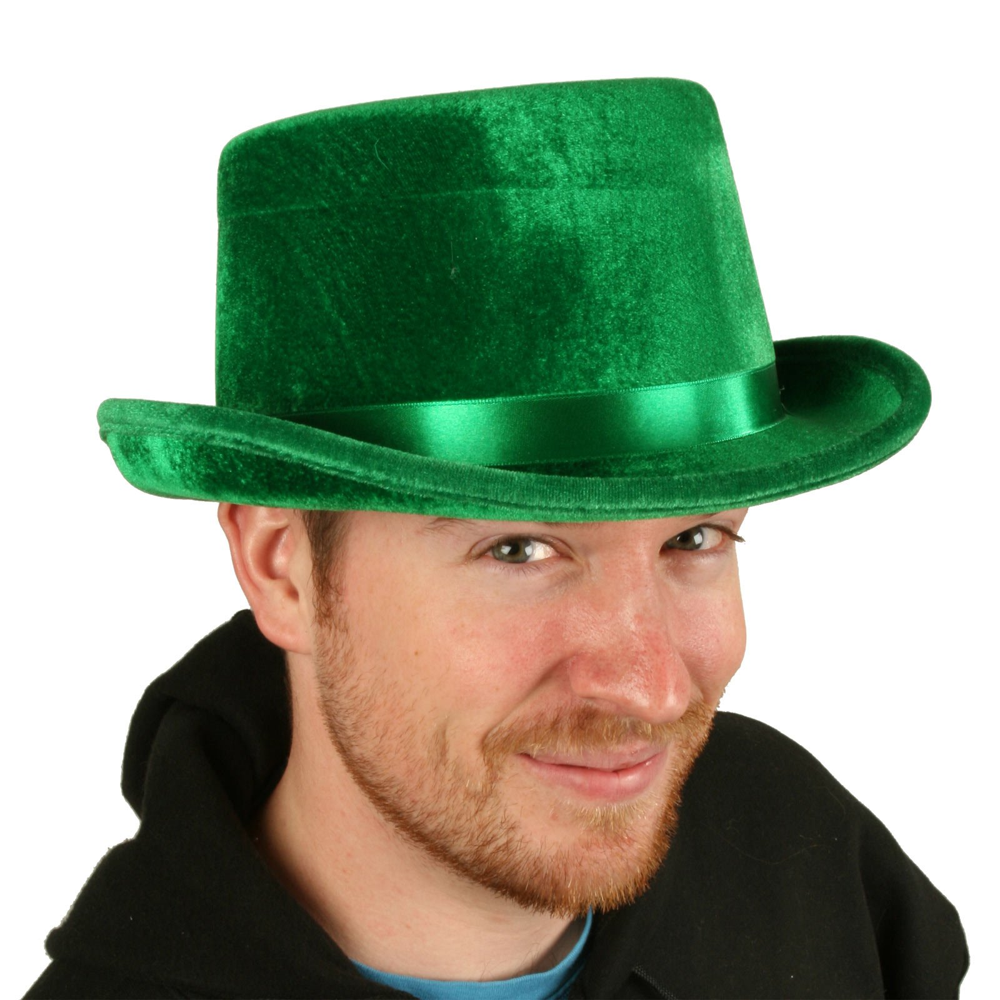

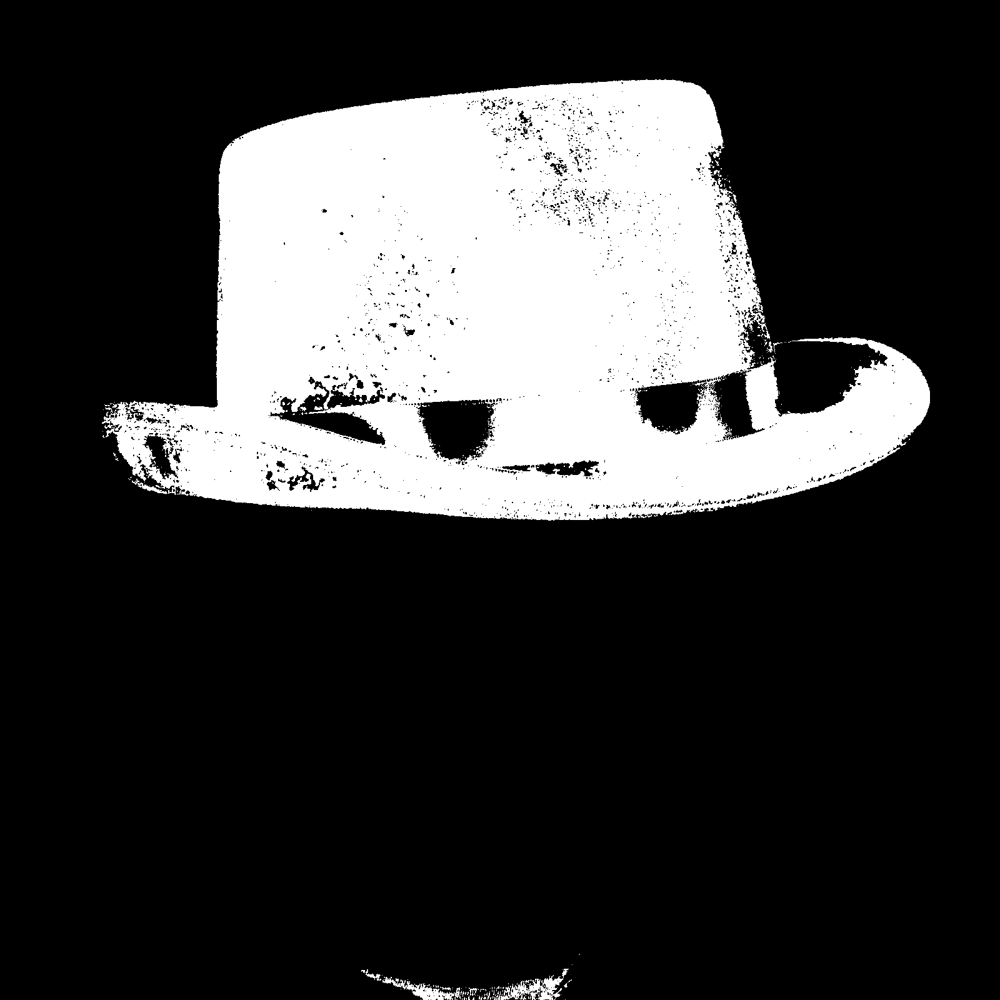

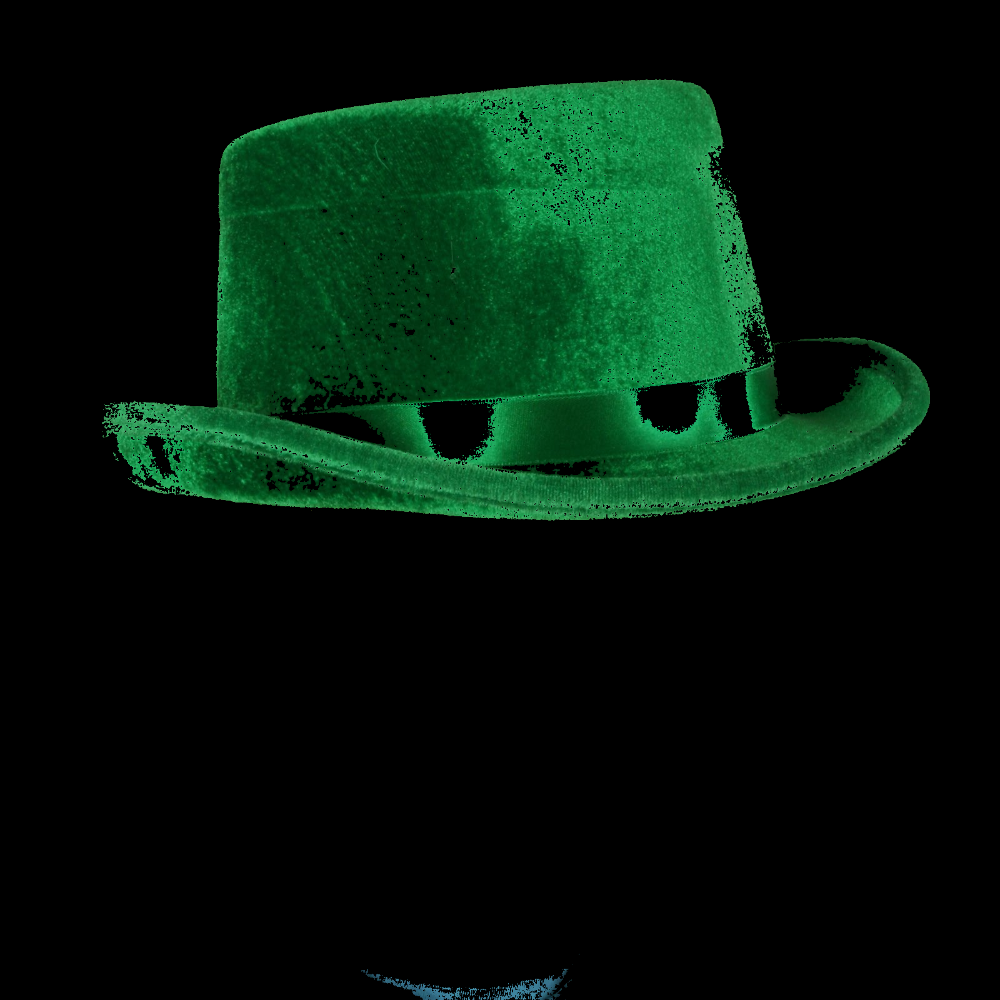

In [ ]:
#Cargamos la imagen de la que queremos reslartar el verde
img = cv2.imread("/content/drive/MyDrive/DeepLearning/Images/Img2.jpg")
#convertimos la imagen a gris
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
lower_red = np.array([30,150,50]) # codigo minimo del verde en del B,G,R
upper_red = np.array([255,255,180]) # codigo maximo del verde en B,G,R
#Creamos una mascara de la imagen donde resaltaremos el color verde
mask_red = cv2.inRange(hsv, lower_red, upper_red) 
#aplicamos la mascara en la imagen
img_result = cv2.bitwise_and(img,img, mask = mask_red)
#visualizamos la imagen
cv2_imshow(img)
cv2_imshow(mask_red)
cv2_imshow(img_result)

##Gradiente de Imágenes

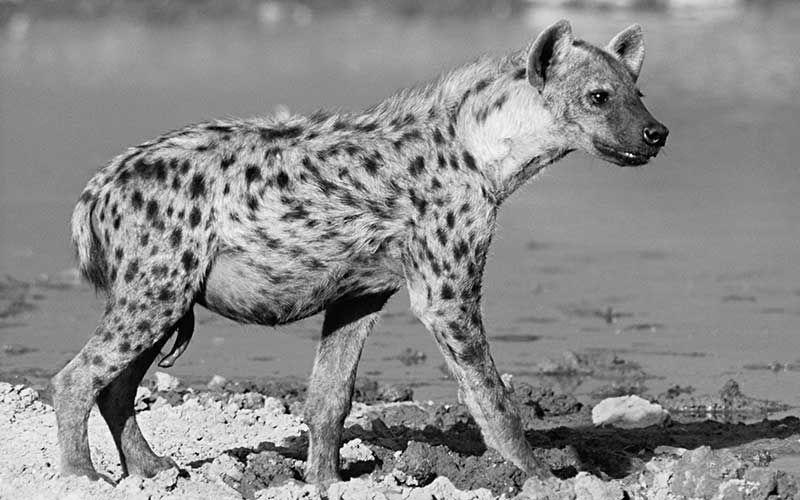

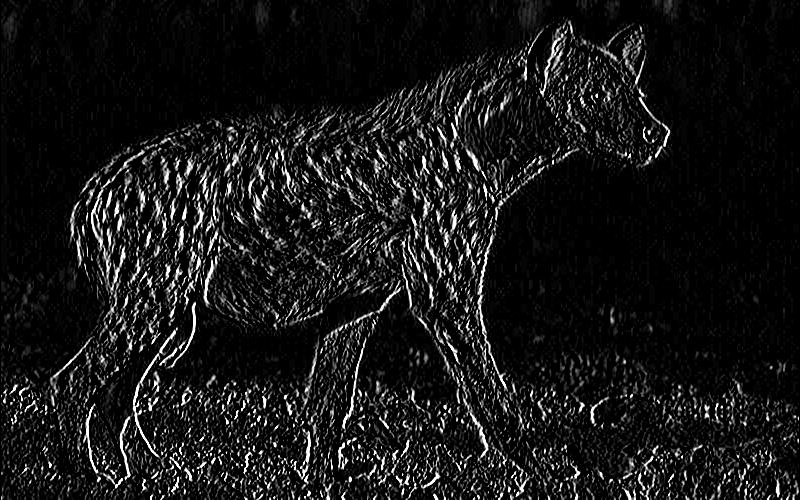

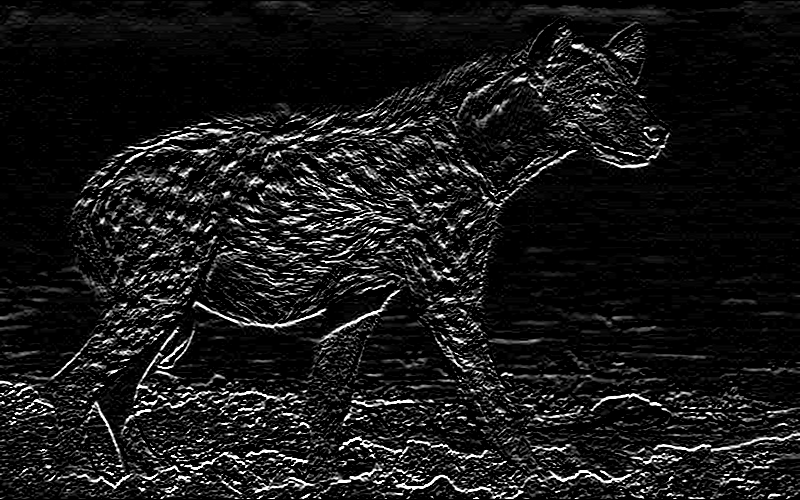

In [ ]:
# cargamos la imagen y la pasamos de una a gris
img = cv2.imread("/content/drive/MyDrive/DeepLearning/Images/Hiena.jpg",0)
#cambiar CV_64F  por CV_8U, si quiere verlo en negro/blanco
laplacian = cv2.Laplacian(img,cv2.CV_64F)
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=3)
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=3)
cv2_imshow(img)
cv2_imshow(sobelx)
cv2_imshow(sobely)

##Gradiente mejorado

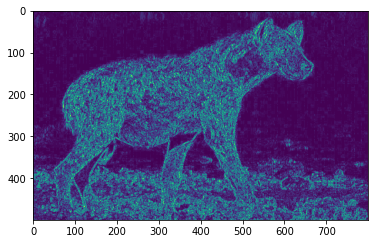

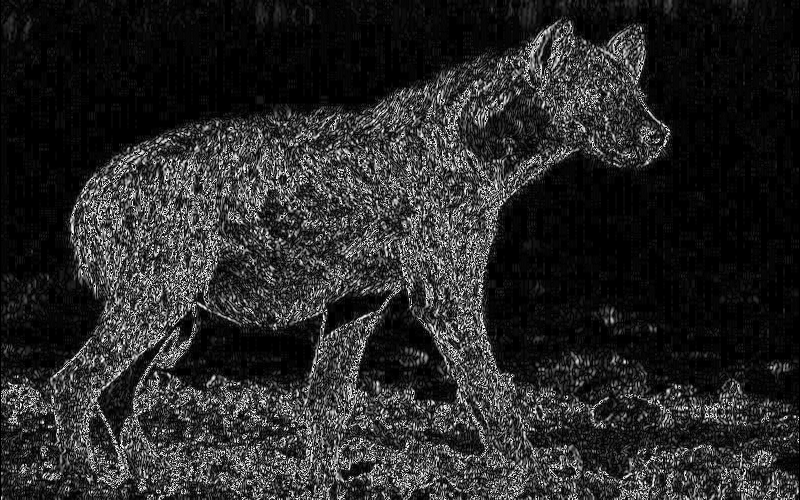

In [ ]:
sobelx8u=cv2.Sobel(img,cv2.CV_8U,1,0,ksize=3)
#Utilizando cv2.CV_64F. Luego toma el valor absoluto y hace la conversión a cv2.CV_8U
sobelx64f=cv2.Sobel(img,cv2.CV_64F,1,0,ksize=3)
abs_sobel64f=np.absolute(sobelx64f)
sobel_8u=np.uint8(abs_sobel64f)
plt.imshow(sobel_8u)
plt.show()
cv2_imshow(sobel_8u)

##Detector de bordes Canny, cv2.Canny ()


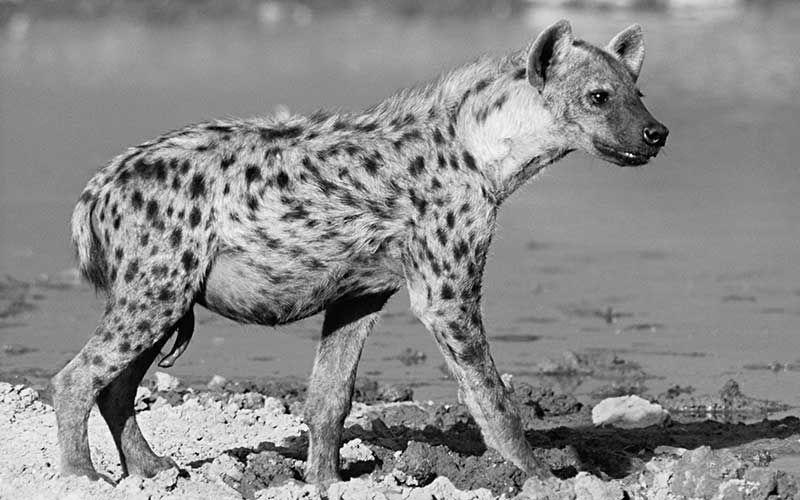

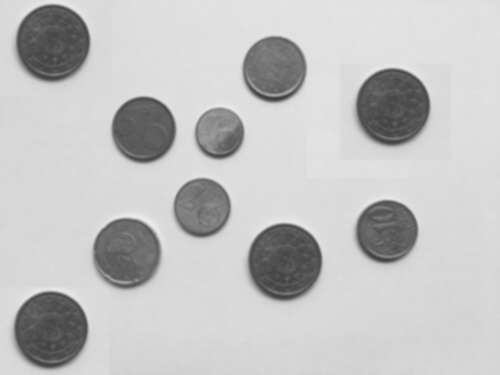

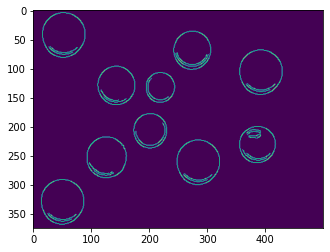

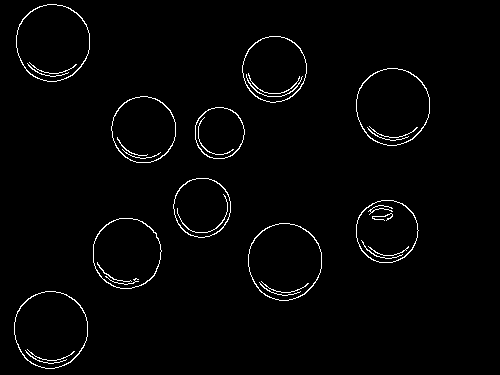

In [ ]:
img_gris = cv2.imread("/content/drive/MyDrive/DeepLearning/Images/coinss.jpg",0)
cv2_imshow(img)
#Aplicamos un filtro gausiano para suavizar la imagen
img_gauss = cv2.GaussianBlur(img_gris, (5,5), 0)
cv2_imshow(img_gauss)
img_canny = cv2.Canny(img_gauss, 50, 150)
plt.imshow(img_canny)
plt.show()
cv2_imshow(img_canny)

In [ ]:
contornos,_=cv2.findContours(img_canny.copy(),cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
print("He encontrado {} objetos".format(len(contornos)))


He encontrado 10 objetos


[[ 26  73 251 251]
 [213  89 234 234]
 [ 64 277 173 173]]


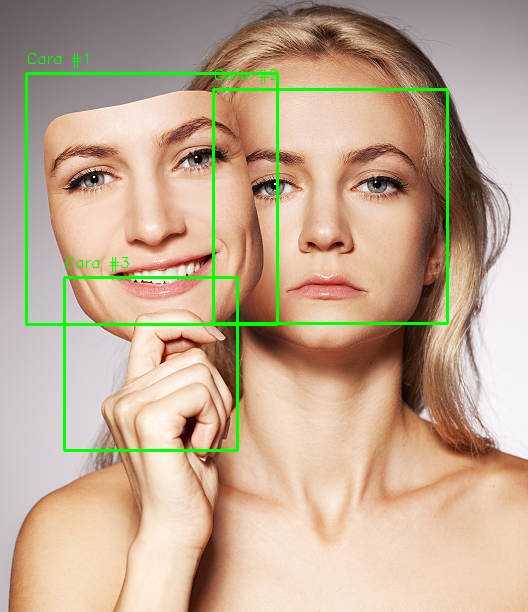

False

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

face_cascade = cv2.CascadeClassifier('/content/drive/MyDrive/DeepLearning/Haarcascade/haarcascade_frontalface_default.xml');
img = cv2.imread("/content/drive/MyDrive/DeepLearning/Images/sino.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
faces = face_cascade.detectMultiScale(gray)
print(faces)
idx=0
for (x,y,w,h) in faces:
  cv2.rectangle(img,(x,y),(x+w,y+h),(0,255,0),2)
  idx += 1
  cv2.putText(img,"Cara #{}".format(idx),(x,y-10),
  cv2.FONT_HERSHEY_SIMPLEX,.5,(0,255,0),1)
cv2_imshow(img)
cv2.imwrite('/content/drive/MyDrive/IA/Computer_Vision/Images/dc_comics_detectada.jpg',img)

[[ 548   25  102  204]
 [ 782   52   92  183]
 [1004   29  111  223]
 [ 300    2  109  218]
 [  60   35  113  225]
 [1003  232  128  255]
 [ 288  205  138  276]
 [  47  206  134  267]
 [ 768  435  128  256]
 [ 291  440  131  261]
 [ 528  449  129  259]
 [  43  468  111  223]
 [1016  456  114  229]]


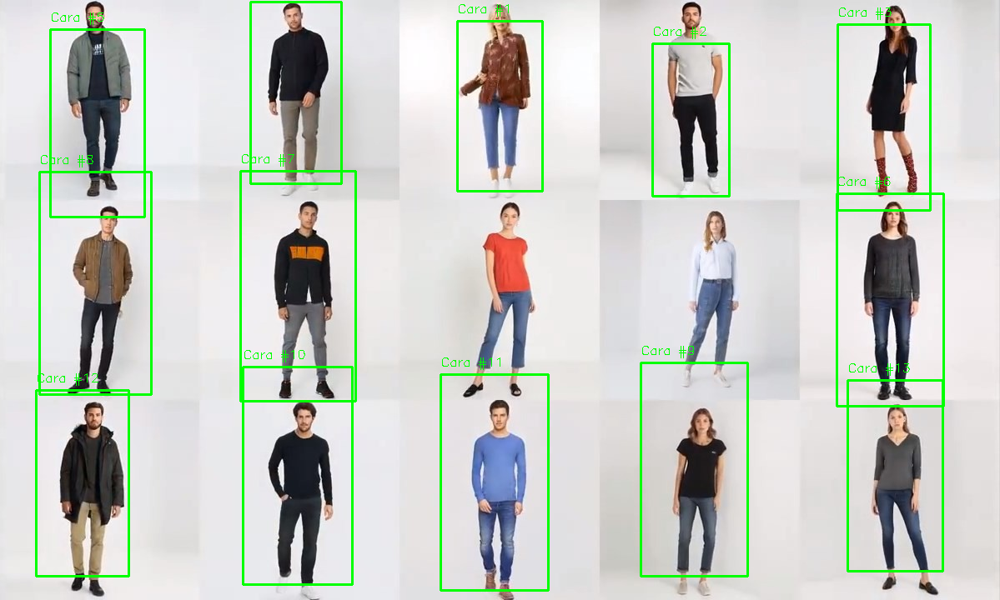

False

In [45]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

face_cascade = cv2.CascadeClassifier('/content/drive/MyDrive/DeepLearning/Haarcascade/haarcascade_fullbody.xml');
img = cv2.imread("/content/drive/MyDrive/DeepLearning/Images/monton2.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
faces = face_cascade.detectMultiScale(gray)
print(faces)
idx=0
for (x,y,w,h) in faces:
  cv2.rectangle(img,(x,y),(x+w,y+h),(0,255,0),2)
  idx += 1
  cv2.putText(img,"Cara #{}".format(idx),(x,y-10),
  cv2.FONT_HERSHEY_SIMPLEX,.5,(0,255,0),1)
cv2_imshow(img)
cv2.imwrite('/content/drive/MyDrive/IA/Computer_Vision/Images/dc_comics_detectada.jpg',img)

# cargando videos con opencv

In [40]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('/content/drive/MyDrive/DeepLearning/Images/Reconocimiento.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [39]:
#video que analizaremos
videoentrada = cv2.VideoCapture('/content/drive/MyDrive/DeepLearning/Images/Reconocimiento.mp4')

In [41]:
property_id = int(cv2.CAP_PROP_FRAME_COUNT) 
totalframes = int(cv2.VideoCapture.get(videoentrada, property_id))
print( "total de frames: "+str(totalframes) )
print(str(videoentrada.get(3))+" X "+str(videoentrada.get(4))+" pixeles")

total de frames: 661
1280.0 X 720.0 pixeles


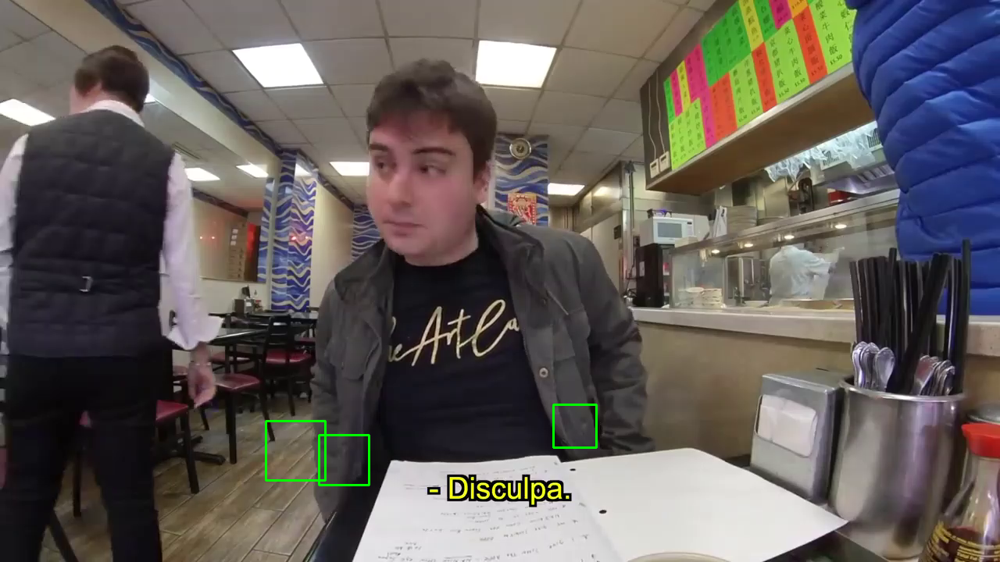

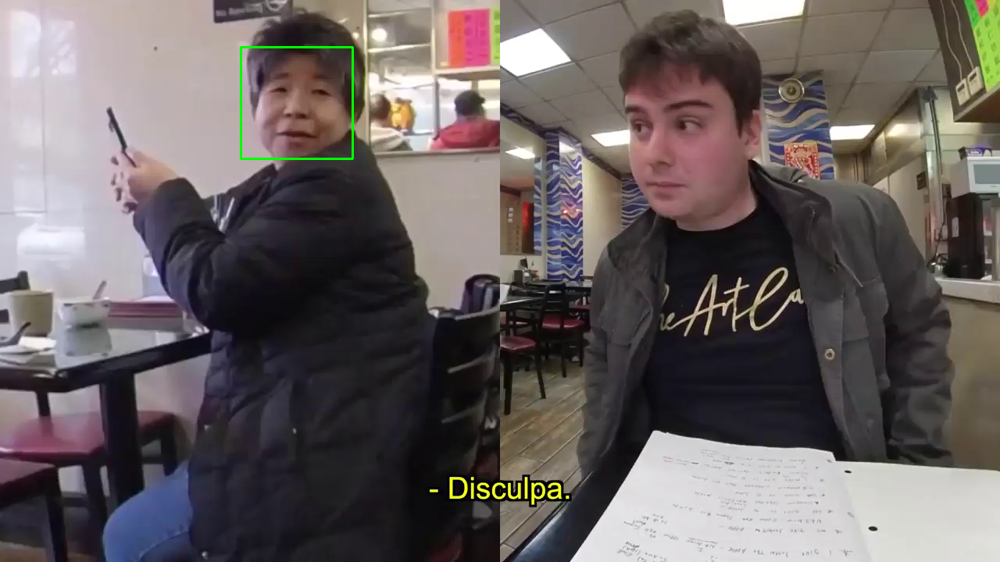

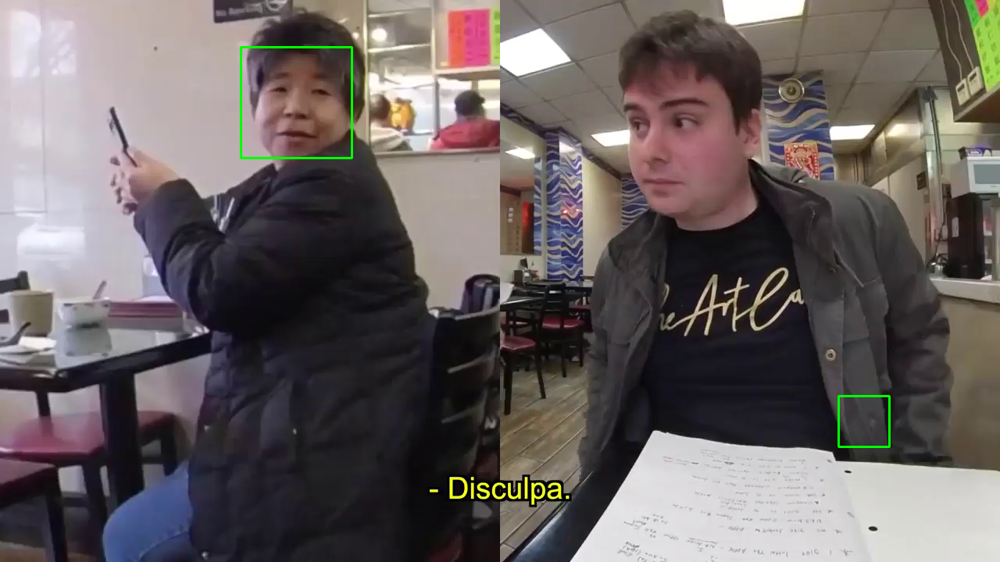

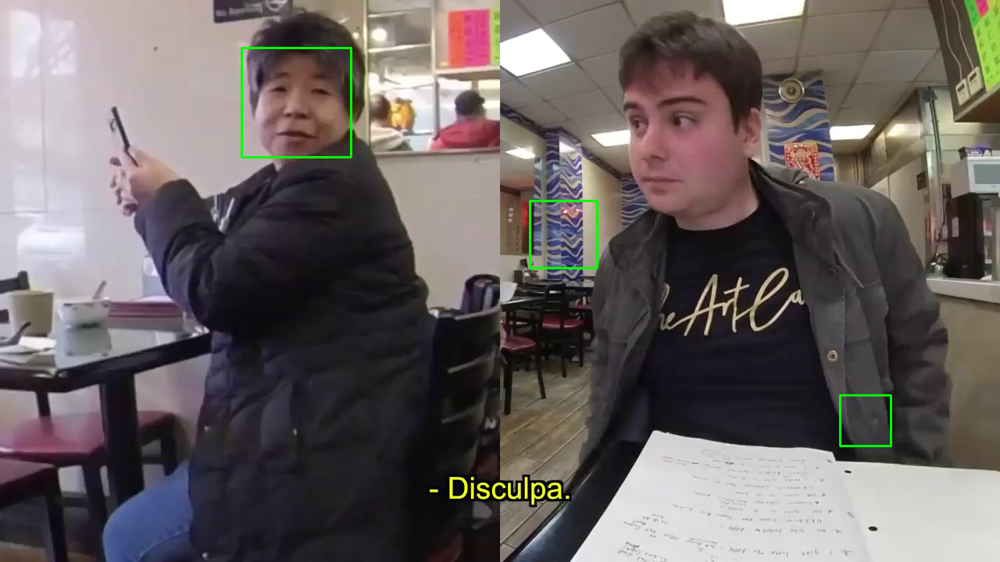

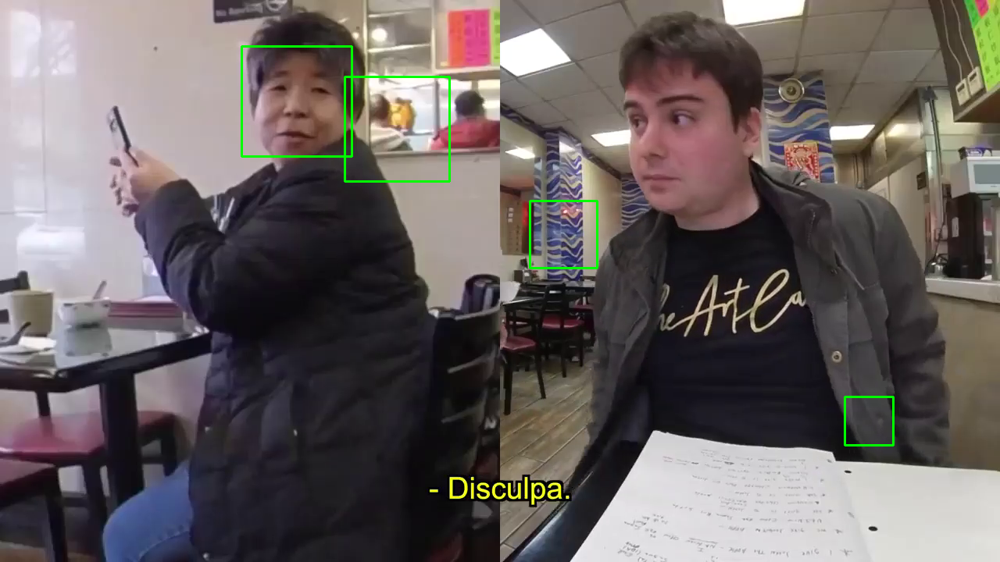

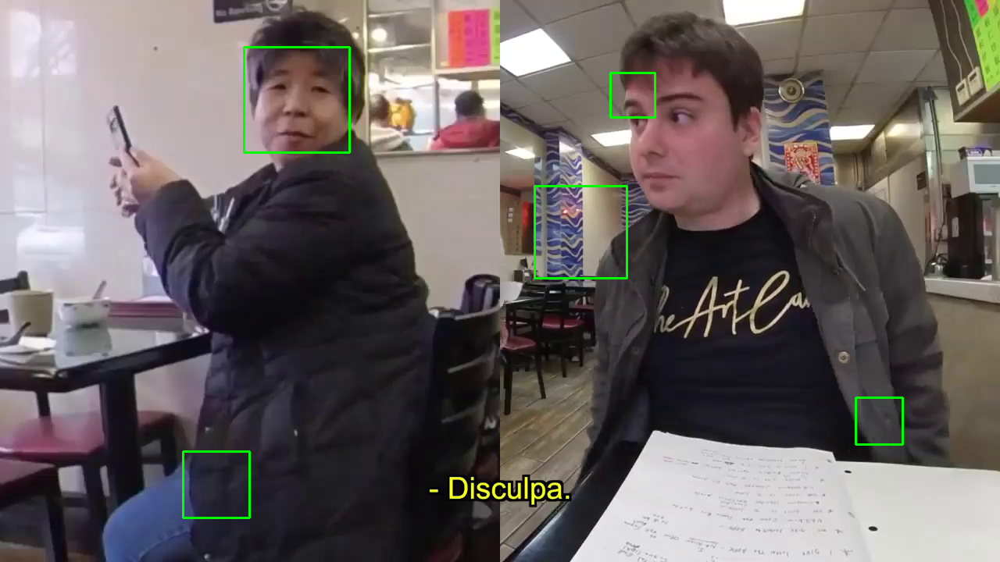

In [43]:
#https://unipython.com/empezando-con-videos/
#recorremos los 6 primeros frames de 1412
face_cascade = cv2.CascadeClassifier('/content/drive/MyDrive/DeepLearning/Haarcascade/haarcascade_frontalface_default.xml')
for x in range(6):
  videoentrada.set(1,x);   
  #ret: retorno (true si es frame se lee correctamente)
  ret, frame = videoentrada.read()
  gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
  faces = face_cascade.detectMultiScale(gray,scaleFactor=1.1,minNeighbors=2,minSize=(40, 40))
  for (x, y, w, h) in faces:
    cv2.rectangle(frame,(x,y),(x+w, y+h),(0, 255, 0),2)
    #roi_gray = gray[y:y+h,x:x+w]
    #roi_color = frame[y:y+h,x:x+w]
  cv2_imshow(frame)

In [44]:
while(videoentrada.isOpened()):
  ret, frame = videoentrada.read()
  if ret == True:
    # Nuestras operaciones sobre los frames se hacen aqui
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
  else:
    break  
videoentrada.release()